<a href="https://colab.research.google.com/github/ProfDoeg/Taller_de_Rumplestiltskin/blob/main/la_prueba.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
! pip install eciespy eth_keys cryptos qrcode
! git clone https://github.com/ProfDoeg/Taller_de_Rumplestiltskin.git
! cp Taller_de_Rumplestiltskin/modules/colegio_tools.py colegio_tools.py

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 69 kB 3.4 MB/s 
     |████████████████████████████████| 43 kB 1.1 MB/s 
     |████████████████████████████████| 2.3 MB 8.6 MB/s 
     |████████████████████████████████| 1.3 MB 15.3 MB/s 
     |████████████████████████████████| 105 kB 46.9 MB/s 
     |████████████████████████████████| 1.8 MB 41.5 MB/s 
  Created wheel for qrcode: filename=qrcode-7.3.1-py3-none-any.whl size=40400 sha256=3e9f18f10efafdf4fbef7bdfe00e435addc58d242706e3eaa7cb2d419a360cfa
  Stored in directory: /root/.cache/pip/wheels/35/fd/04/2768886c56207acee0d6dc6b9bd5d06dac63a810f0c0a42516
Successfully built qrcode
Cloning into 'Taller_de_Rumplestiltskin'...
remote: Enumerating objects: 25, done.
remote: Counting objects: 100% (25/25), done.
remote: Compressing objects: 100% (22/22), done.
remote: Total 25 (delta 5), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (25/25), do

# Images de  Textil de Hayagriva y Christophia

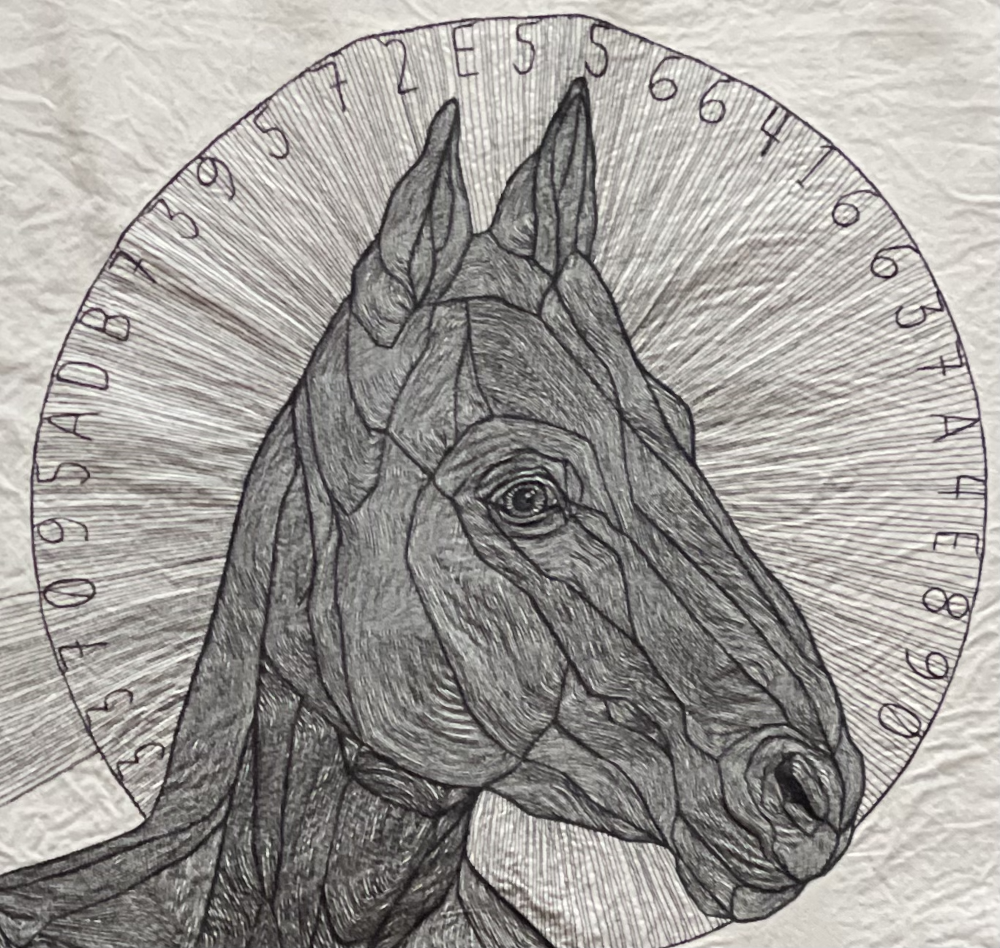

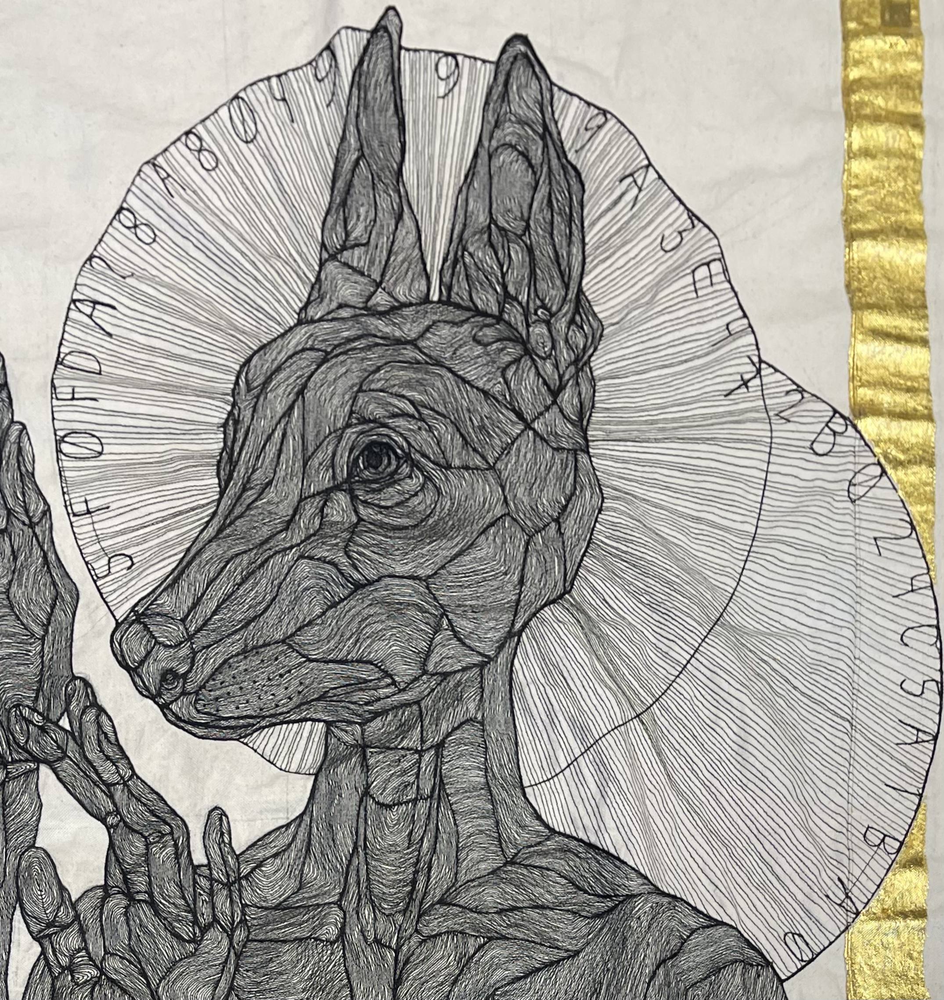

In [2]:
from IPython.display import Image 
import os
imgs = ['hayagriva','christophia']
for img in imgs:
    path = f'Taller_de_Rumplestiltskin/imgs/{img}.png'
    show=Image(path,width = 300)
    display(show)

In [3]:
from colegio_tools import *
import hashlib

In [4]:
prueba_txid='1ec0ee9b27d6ab91169b28f3acdada51cab8eb03af8c2a7e128d122a2dba7d0c'
(prueba_cabeza,prueba_cuerpo)=read_cadenas(prueba_txid)

In [5]:
print(prueba_cabeza[:16])

c1dd0001ccff0001


In [6]:
print(bytes.fromhex(prueba_cabeza[16:]))

b'|SHA256|337095adb739572e5566416637a4e8905f0fda28a804999a3e472b024c5a1ba0'


In [7]:
hash=hashlib.sha256(prueba_cuerpo)
print(hash.hexdigest())
print(hash.hexdigest()[:32])
print(hash.hexdigest()[32:])

337095adb739572e5566416637a4e8905f0fda28a804999a3e472b024c5a1ba0
337095adb739572e5566416637a4e890
5f0fda28a804999a3e472b024c5a1ba0


In [8]:
prueba_key_dict=dict([tuple(elem.replace('0x','04').split(':')) for elem in prueba_cuerpo.decode().split('\n') if 'Public' in elem])
prueba_key_dict

{'Hayagriva_Public': '04505d743671977487913280812271df3e8b27126788d03b5dd84430280b710b20584a8c442082960a67214fba8f45e97c7aeca15a6a59ba98f830dfe9e487d8cd',
 'Christophia_Public': '046bb329760057768325b73b3420650c0d077790ce78a54a5f40630a5342d11310b24308716b30b3e86539964f701e4e570ce497b6073c652ab153dbe676b57970',
 'Anthony_Public': '04cd477d18b1ed8549fd6d9d576c8378deed4df4a926f0fe8ea9dbde07a72bb5911bf9a1f380ea24adabff0b91eb5525e4526f22d9ed1e3bcbebe97093d4871f53'}

In [9]:
import requests
import json
r = requests.get(f'https://sochain.com/api/v2/tx/DOGE/{prueba_txid}')
prueba_tx_script=json.loads(r.text)['data']['inputs'][0]['script_hex']
prueba_tx_script

'00483045022100b9c3dfb3000786b32fe380e6711f30d9e153fe621f94ef08516841c79b71c9ba02201137b430f845a1d4a789d772d83f0e8e043e3d0f26a9f2e34823c7cfd954768501483045022100d047246ad04e719f63a19b0452f8d6fc41a636da804603c6038ae645d8dbbe650220782dc5000ca3e5655c4244ba8465d3226605159de22c32b6dfcb26f9f5d5e72501483045022100d242b99d4dcd85a21a749cedfe8cd88991603327fb7407dcd92e81553c2cc4c8022063f24500e3aff6b174be4b0d7dd4db68930cf40b9b0f98f206019383ecfee5c4014cc9534104505d743671977487913280812271df3e8b27126788d03b5dd84430280b710b20584a8c442082960a67214fba8f45e97c7aeca15a6a59ba98f830dfe9e487d8cd41046bb329760057768325b73b3420650c0d077790ce78a54a5f40630a5342d11310b24308716b30b3e86539964f701e4e570ce497b6073c652ab153dbe676b579704104cd477d18b1ed8549fd6d9d576c8378deed4df4a926f0fe8ea9dbde07a72bb5911bf9a1f380ea24adabff0b91eb5525e4526f22d9ed1e3bcbebe97093d4871f5353ae'

In [10]:
all([ key in prueba_tx_script for key in  prueba_key_dict.values()])

True